In [1]:
import numpy as np
import umap
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import os
import json
import torch
from tqdm import tqdm
from sklearn.manifold import TSNE

def load_object(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)
    

data_dir = '/data/grbv/PDBbind/DTI5_input_data_processed'

/data/grbv/.conda/envs/plot_cluster/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Categories of Datapoints

embedding_descriptor = 'ankh_base'

casf2016_dir = '/data/grbv/PDBbind/raw_data/CASF-2016/coreset'
casf2013_dir = '/data/grbv/PDBbind/raw_data/CASF-2013/coreset'

casf2013_dir = '/data/grbv/PDBbind/raw_data/CASF-2013/coreset'
casf2013_c4_dir = f'/data/grbv/PDBbind/DTI_5/input_graphs_{embedding_descriptor}/test_data/casf2013_c4'
casf2016_dir = '/data/grbv/PDBbind/raw_data/CASF-2016/coreset'
casf2016_c4_dir = f'/data/grbv/PDBbind/DTI_5/input_graphs_{embedding_descriptor}/test_data/casf2016_c4'

train_data_dir = f'/data/grbv/PDBbind/DTI_5/input_graphs_{embedding_descriptor}/training_data'

training_datapoints = [file[0:4] for file in os.listdir(train_data_dir) if file[0].isdigit()]

casf2016_complexes = [folder for folder in os.listdir(casf2016_dir)]
casf2013_complexes = [folder for folder in os.listdir(casf2013_dir)]

casf2016_datapoints = [folder for folder in os.listdir(casf2016_dir)]
casf2016_datapoints_filtered = [file[0:4] for file in os.listdir(casf2016_c4_dir)]
casf2013_datapoints = [folder for folder in os.listdir(casf2013_dir)]
casf2013_datapoints_filtered = [file[0:4] for file in os.listdir(casf2013_c4_dir)]

test_datapoints = casf2016_datapoints + casf2013_datapoints

In [3]:
# Generate a list of all complexes

data_dir = '/data/grbv/PDBbind/DTI5_input_data_processed'
complexes = [folder for folder in os.listdir(data_dir) if folder[0].isdigit() and len(folder) == 4]

affinity_dict_path = '/data/grbv/PDBbind/DTI5_general_affinity_dict.pkl'
affinity_dict = load_object(affinity_dict_path)

In [4]:
# data_dict_json = {}

# for complex in tqdm(complexes):
#     data_dict_json[complex] = {}

#     data_dict_json[complex]['affinity'] = affinity_dict[complex]['log_kd_ki']
#     data_dict_json[complex]['training_datapoint'] = complex in training_datapoints
#     data_dict_json[complex]['test_datapoint'] = complex in test_datapoints
#     data_dict_json[complex]['casf2016_datapoint'] = complex in casf2016_datapoints
#     data_dict_json[complex]['casf2016_datapoint_filtered'] = complex in casf2016_datapoints_filtered
#     data_dict_json[complex]['casf2013_datapoint'] = complex in casf2013_datapoints
#     data_dict_json[complex]['casf2013_datapoint_filtered'] = complex in casf2013_datapoints_filtered

# # Convert the counter to a dictionary and write it to a JSON file
# with open('PDBbind_data.json', 'w', encoding='utf-8') as json_file:
#     json.dump(data_dict_json, json_file, ensure_ascii=False, indent=4)

# print("Results have been written to results.json")

In [5]:
data_dir = '/data/grbv/PDBbind/DTI5_input_data_processed'

# Read the JSON file and convert it into a dictionary
with open('/home/grabeda2/DTI/clustering/PDBbind_data.json', 'r', encoding='utf-8') as json_file:
    complexes = json.load(json_file)

In [6]:
# Load Ankh protein embeddings

# protein_embeddings = np.array([], dtype=np.int64).reshape(0, 768)

# for complex in tqdm(complexes):
#     emb_path = os.path.join(data_dir, complex, f'{complex}_ankh_base.pt')
#     emb = torch.load(emb_path, map_location='cpu')
#     protein_emb = np.mean(emb, axis=0)
#     protein_embeddings = np.vstack((protein_embeddings, protein_emb))

# print(protein_embeddings.shape)

In [7]:
# with open('clustering/ankh_embeddings.npy', 'wb') as f:
#     np.save(f, protein_embeddings)

In [8]:
# Load ChemBERTa ligand embeddings

# ligand_embeddings = np.array([], dtype=np.int64).reshape(0, 384)

# for complex in tqdm(complexes):
#     emb_path = os.path.join(data_dir, complex, f'{complex}_ChemBERTa-77M-MLM.pt')
#     emb = torch.load(emb_path, map_location='cpu').numpy()
#     ligand_emb = np.mean(emb, axis=0)
#     ligand_embeddings = np.vstack((ligand_embeddings, ligand_emb))

# print(ligand_embeddings.shape)

In [9]:
# with open('clustering/ChemBERTa_embeddings.npy', 'wb') as f:
#     np.save(f, ligand_embeddings)

# PLOT EMBEDDINGS

In [10]:
def plot_clustering(embedding, c, title):

    colormap = {0:'grey', 1:'green', 2:'red'}
    sizemap = {0:1, 1:3, 2:3}

    # Plotting the results
    plt.figure(figsize=(8,8), dpi=400)
    plt.style.use('ggplot')
    plt.scatter(embedding[:, 0], embedding[:, 1], s=[sizemap[i] for i in c], c=[colormap[i] for i in c], alpha=0.4)
    plt.xlabel('component 1')
    plt.ylabel('component 2')
    plt.title(title)
    plt.show()


In [11]:
# Coloring of Points baded on the dataset membership

c = []

for complex in complexes:

    if complexes[complex]['training_datapoint']: c.append(0)
    elif complexes[complex]['casf2016_datapoint_filtered']: c.append(1)
    elif complexes[complex]['casf2013_datapoint_filtered']: c.append(1)
    else: c.append(2)

## Protein Embeddings

In [12]:
embedding = np.load('clustering/ankh_embeddings.npy')
embedding.shape

(19143, 768)

### T-SNE

In [13]:
# Configure t-SNE parameters
tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=300)

# Apply t-SNE to your data
tsne_embedding = tsne.fit_transform(embedding)

In [14]:
tsne_embedding.shape

(19143, 2)

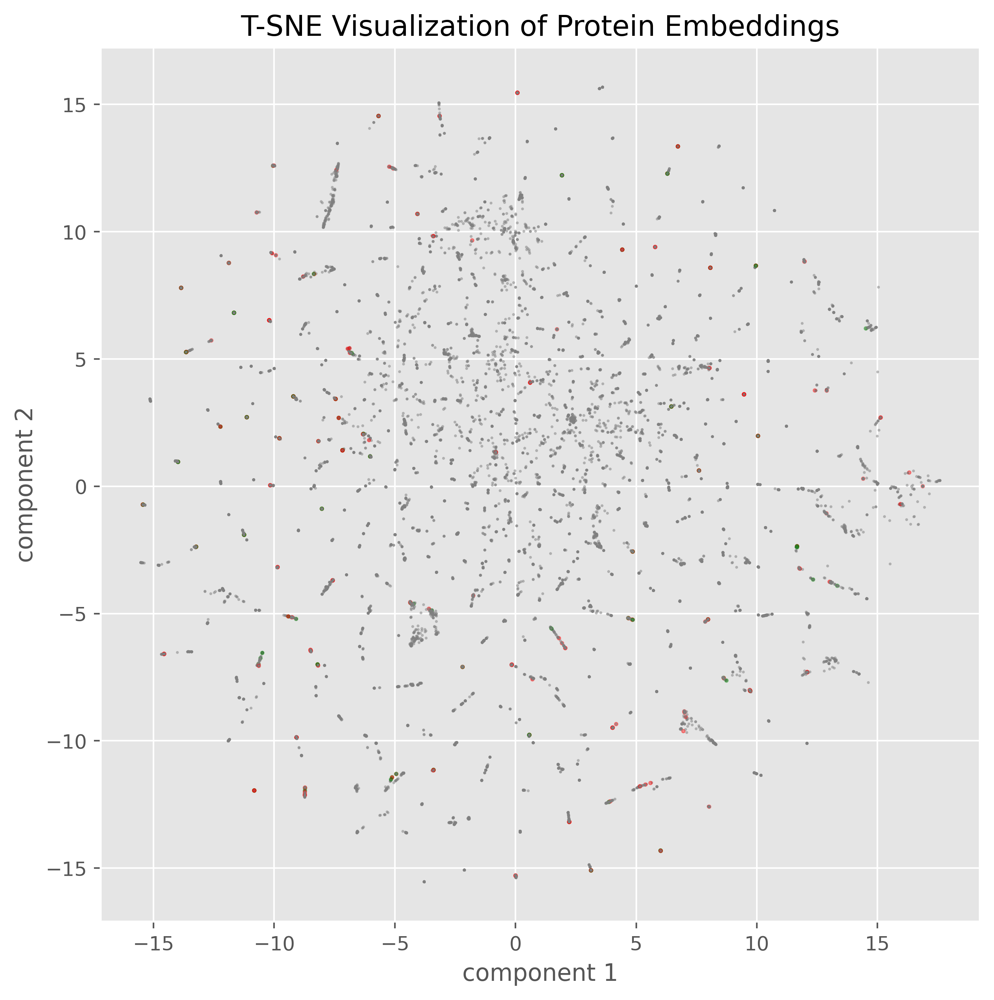

In [15]:
plot_clustering(tsne_embedding, c, 'T-SNE Visualization of Protein Embeddings')

### UMAP

In [16]:
# Reduce fingerprints to 2D with UMAP

reducer = umap.UMAP(min_dist=0.75, n_neighbors=15)
umap_embedding = reducer.fit_transform(embedding)

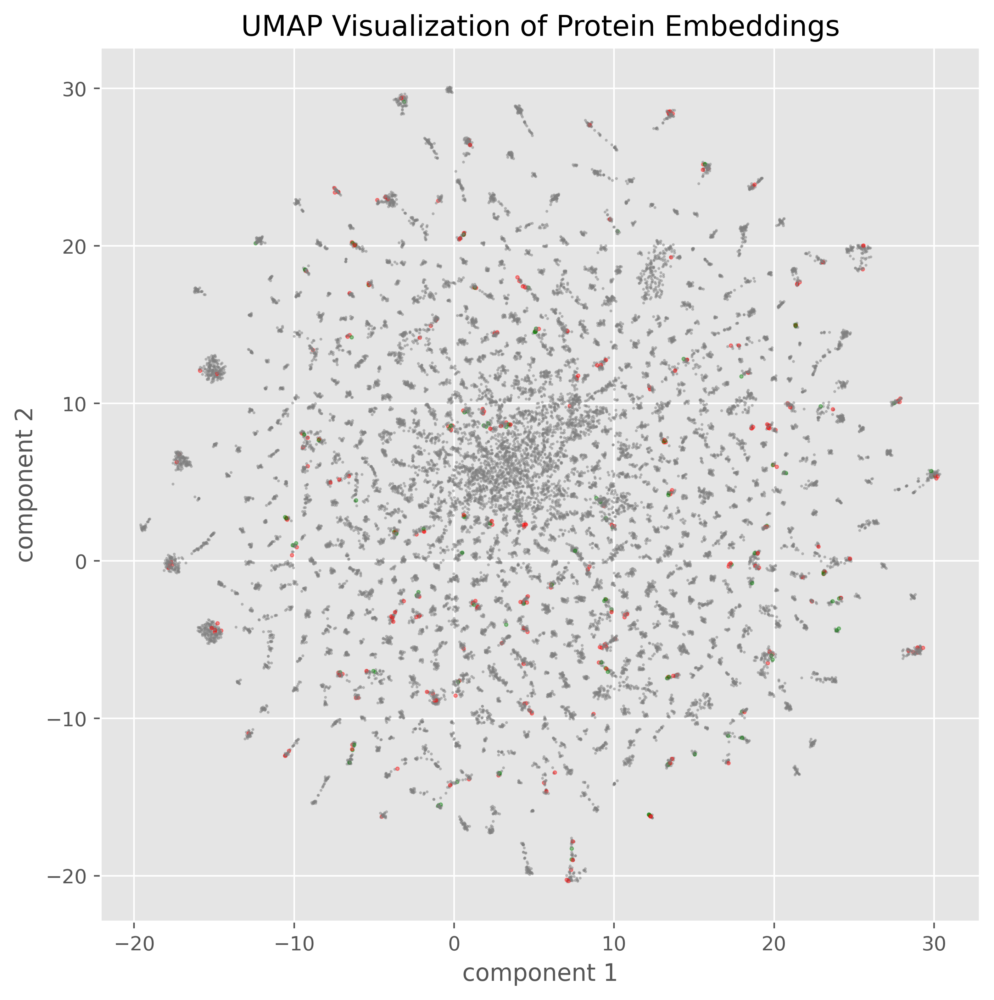

In [17]:
plot_clustering(umap_embedding, c, 'UMAP Visualization of Protein Embeddings')

## Ligand Embeddings

In [18]:
embedding = np.load('clustering/ChemBERTa_embeddings.npy')
embedding.shape

(19143, 384)

### T-SNE

In [19]:
# Configure t-SNE parameters
tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=300)

# Apply t-SNE to your data
tsne_embedding = tsne.fit_transform(embedding)

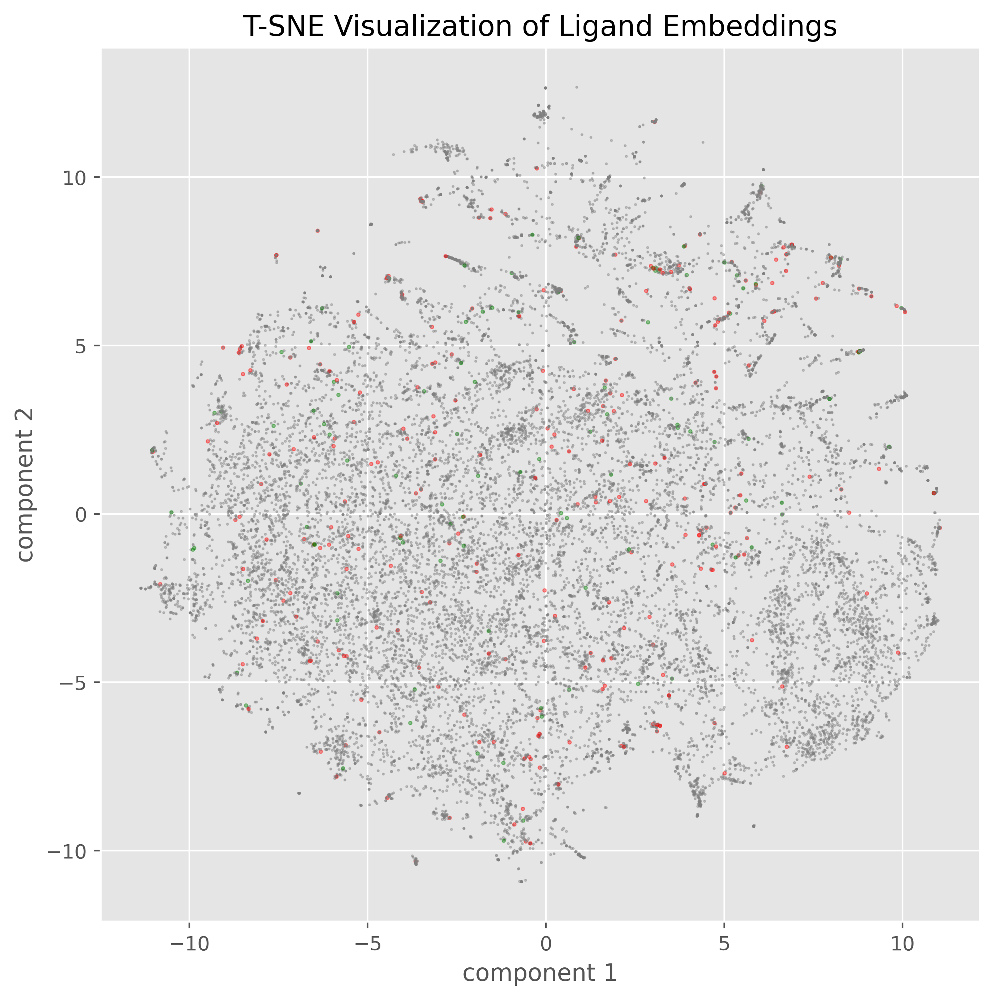

In [20]:
plot_clustering(tsne_embedding, c, 'T-SNE Visualization of Ligand Embeddings')

### UMAP

In [21]:
# Reduce fingerprints to 2D with UMAP

reducer = umap.UMAP(min_dist=0.75, n_neighbors=15)
umap_embedding = reducer.fit_transform(embedding)

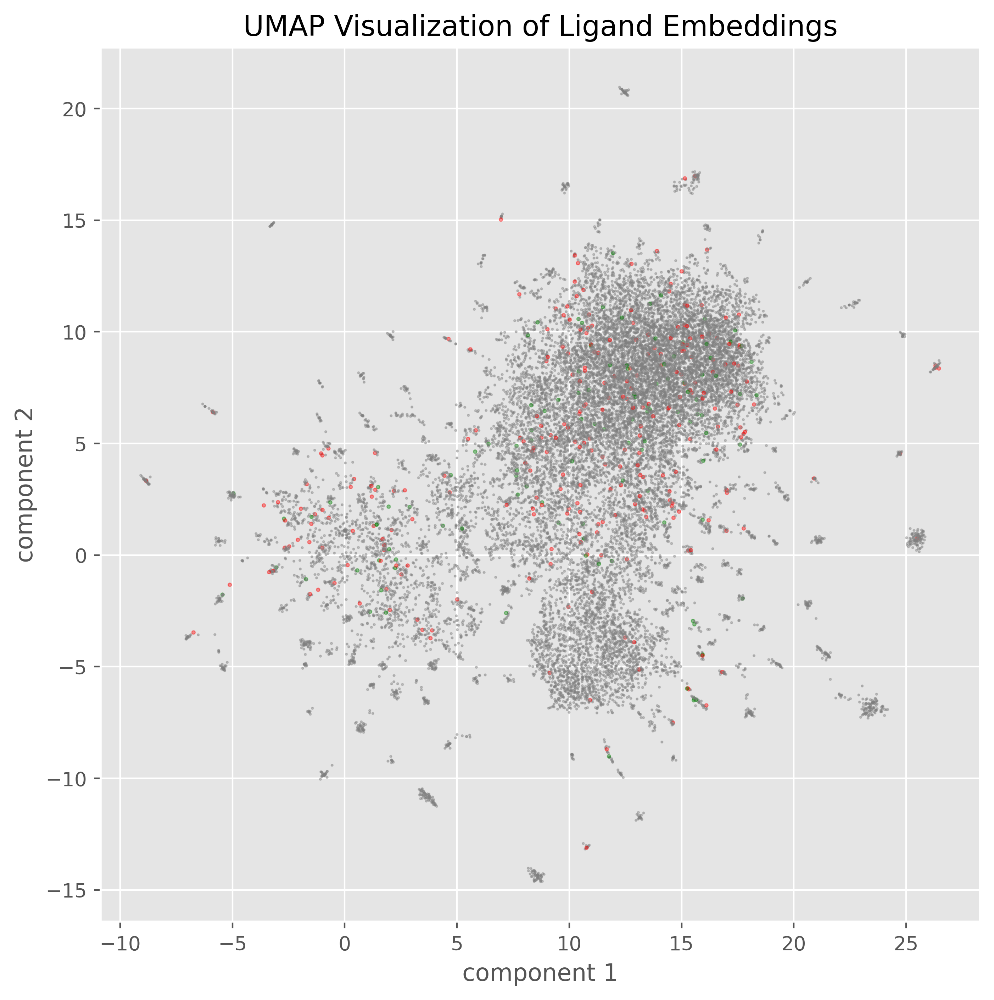

In [22]:
plot_clustering(umap_embedding, c, 'UMAP Visualization of Ligand Embeddings')

## Coloring of Clusters

In [149]:
ligand_embedding = np.load('clustering/ChemBERTa_embeddings.npy')
protein_embedding = np.load('clustering/ankh_embeddings.npy')

combined_embedding = np.hstack((ligand_embedding, protein_embedding))

In [150]:
# Read the JSON file and convert it into a dictionary
with open('/home/grabeda2/DTI/dataset_filtering/C4/c4_test_dataset_similarities.json', 'r', encoding='utf-8') as json_file:
    testset_conflicts = json.load(json_file)

print(len(testset_conflicts))


259


In [193]:
cluster_dict = {}

for cluster in testset_conflicts:

    if cluster in casf2013_datapoints or cluster in casf2016_datapoints:
        if len(testset_conflicts[cluster]) > 10:
            cluster_dict[cluster] = testset_conflicts[cluster]
            continue



n_clusters = len(cluster_dict)
print(n_clusters)

31


In [214]:
## Coloring of Points

c = []
s = []
ec = []

for complex in complexes:

    found = False
    string = f'{complex} '

    for i, cluster in enumerate(cluster_dict):

        if complex == cluster:
            c.append(i)
            s.append(12)
            ec.append(1)
            string += f'complex is a cluster name ({i})'
            found = True

        elif complex in cluster_dict[cluster]:
            c.append(i)
            s.append(3)
            ec.append(0)
            string += f'complex found in cluster {cluster}({i})'
            found = True
    
    
    if not found:
        c.append(0)
        s.append(1)
        ec.append(0)
        string += 'not found in cluster'


    #print(string)

In [215]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

def plot_clustering(embedding, c, s, ec, title):
    # Choose a colormap
    cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors
    
    # Create a normalized array of indices from 0 to 1
    normalized_indices = np.array(c) / max(c)
    
    # Map normalized indices to colors from the colormap
    colors = cmap(normalized_indices)
    alpha = [0.04 if color == 0 else 0.7 for color in c]
    edgecolors = np.array([colors[i].tolist() if ec[i] == 0 else [0.,0.,0.,1.] for i in range(len(ec))])

    # Plotting the results
    plt.figure(figsize=(8,8), dpi=400)
    plt.style.use('ggplot')
    plt.scatter(embedding[:, 0], embedding[:, 1], s=s, c=colors, edgecolors=edgecolors, alpha=alpha)  # Using a fixed size for simplicity
    plt.xlabel('component 1')
    plt.ylabel('component 2')
    plt.title(title)
    plt.show()

### t-SNE

In [216]:
# Configure t-SNE parameters
tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=300)

# Apply t-SNE to your data
tsne_protein = tsne.fit_transform(protein_embedding)

/tmp/ipykernel_2853946/250346826.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors


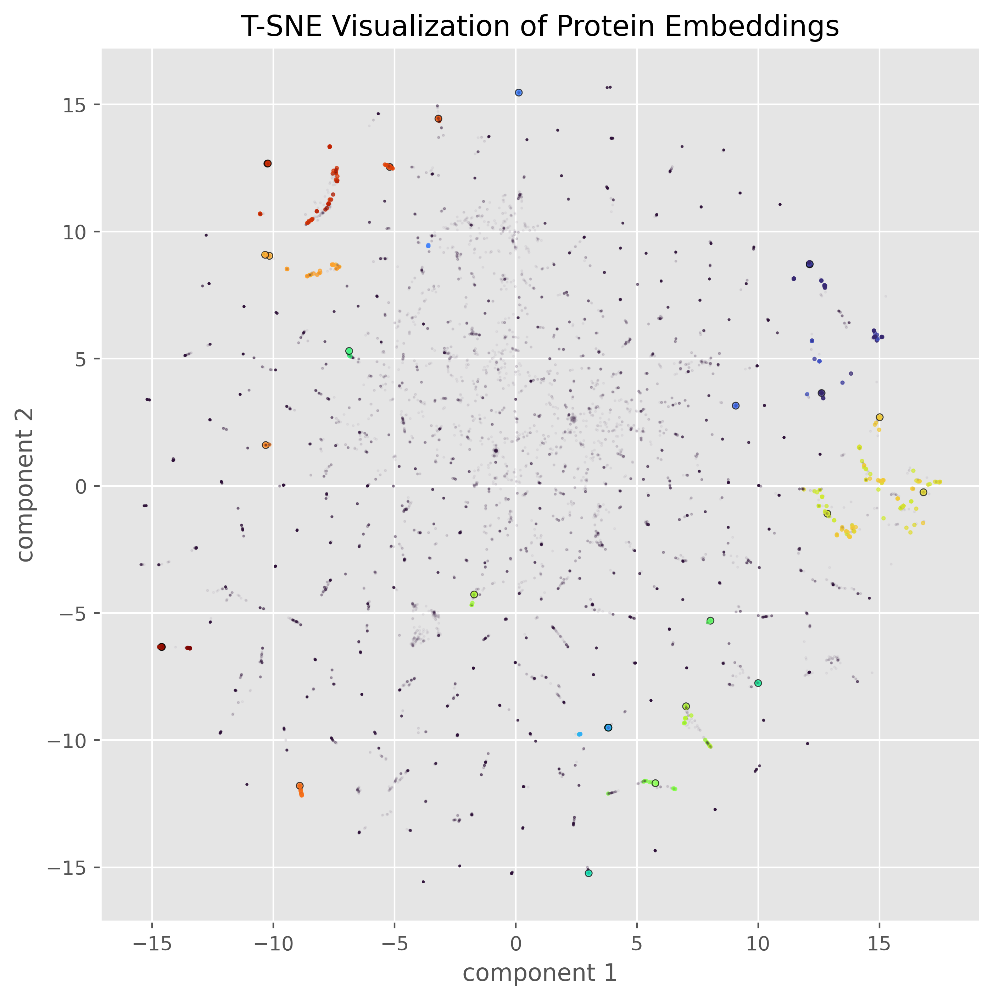

In [217]:
plot_clustering(tsne_protein, c, s, ec, 'T-SNE Visualization of Protein Embeddings')

In [218]:
# Configure t-SNE parameters
tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=300)

# Apply t-SNE to your data
tsne_ligand = tsne.fit_transform(ligand_embedding)

/tmp/ipykernel_2853946/250346826.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors


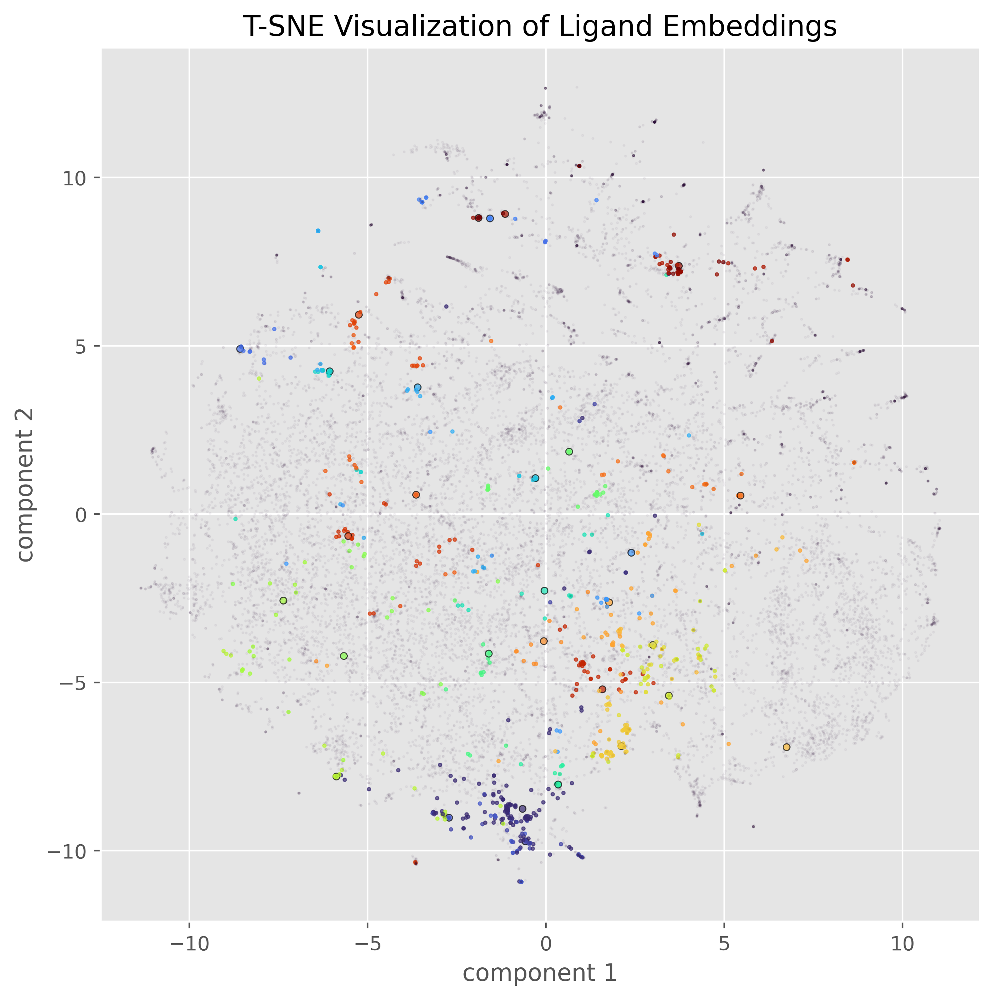

In [219]:
plot_clustering(tsne_ligand, c, s, ec, 'T-SNE Visualization of Ligand Embeddings')

In [220]:
# Configure t-SNE parameters
tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=300)

# Apply t-SNE to your data
tsne_combined = tsne.fit_transform(combined_embedding)

/tmp/ipykernel_2853946/250346826.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors


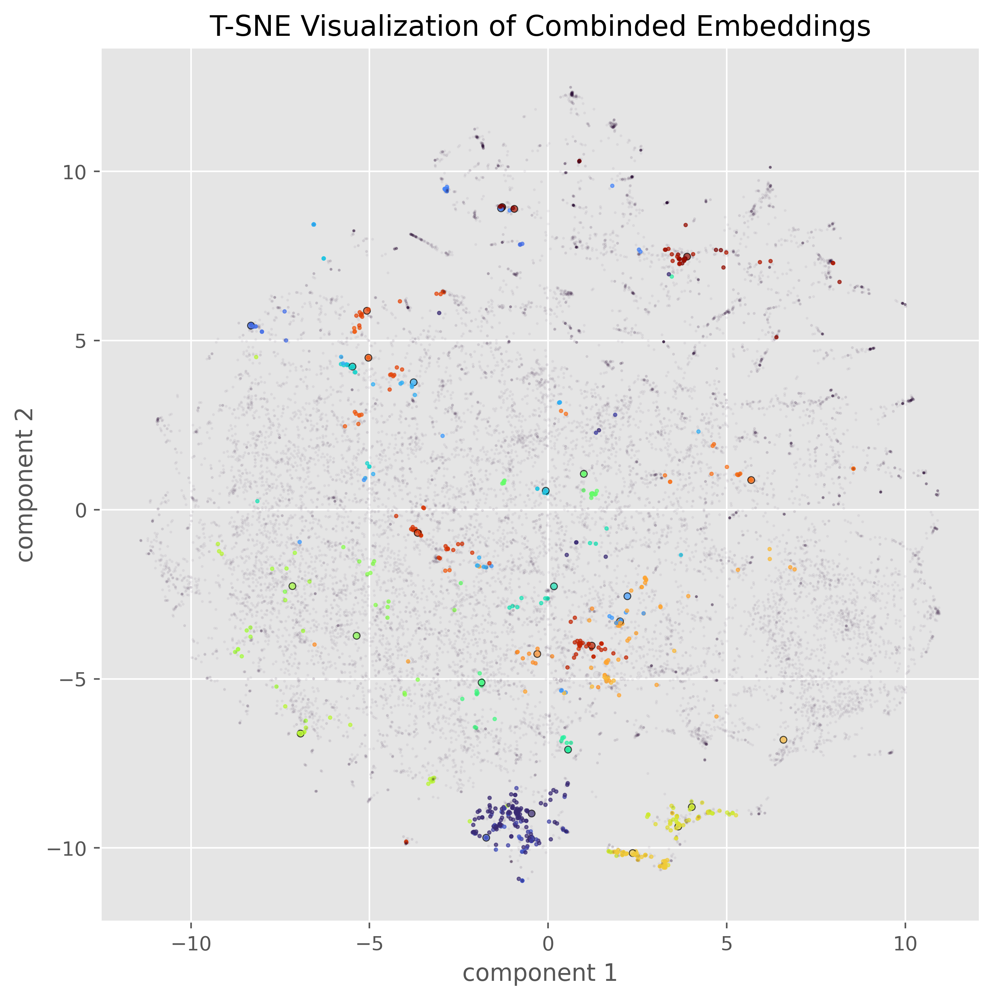

In [221]:
plot_clustering(tsne_combined, c, s, ec, 'T-SNE Visualization of Combinded Embeddings')

### UMAP

In [222]:
reducer = umap.UMAP(min_dist=0.75, n_neighbors=15)
umap_protein = reducer.fit_transform(protein_embedding)

/tmp/ipykernel_2853946/250346826.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors


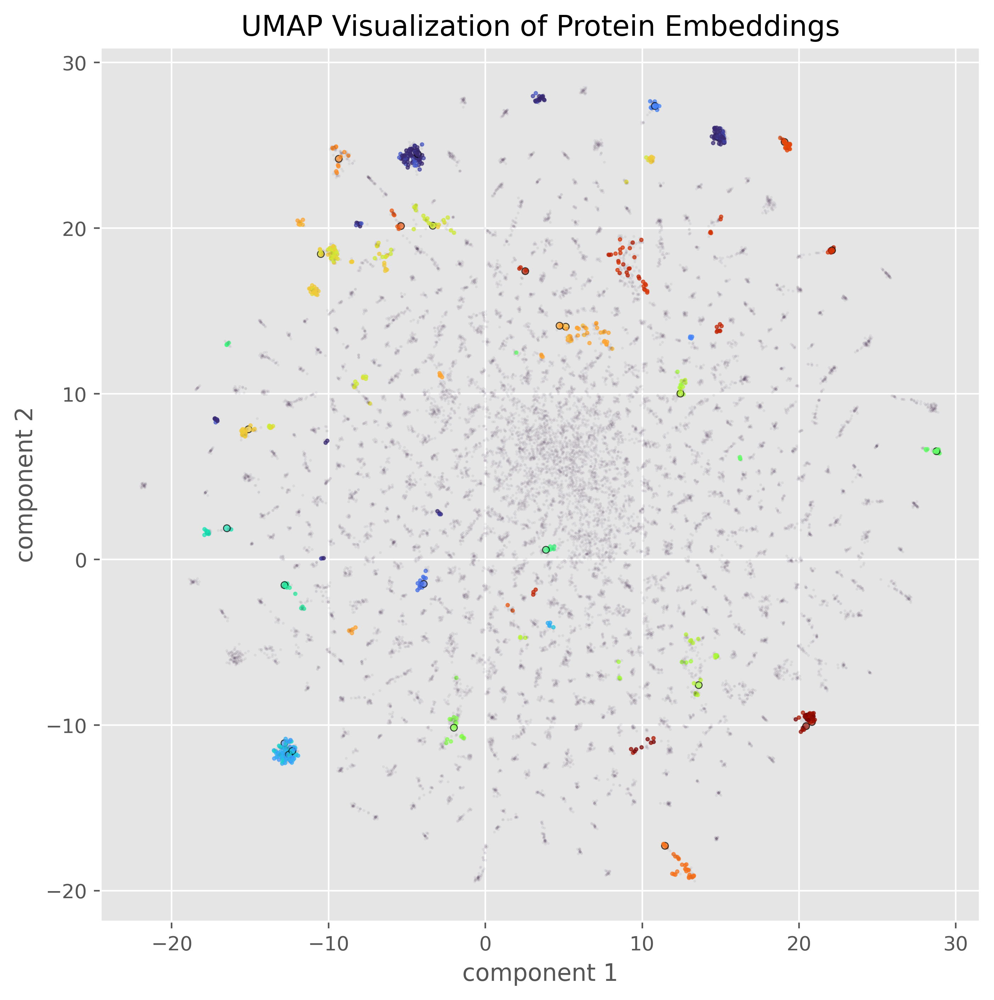

In [223]:
plot_clustering(umap_protein, c, s, ec, 'UMAP Visualization of Protein Embeddings')

In [224]:
reducer = umap.UMAP(min_dist=0.75, n_neighbors=15)
umap_ligand = reducer.fit_transform(ligand_embedding)

/tmp/ipykernel_2853946/250346826.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors


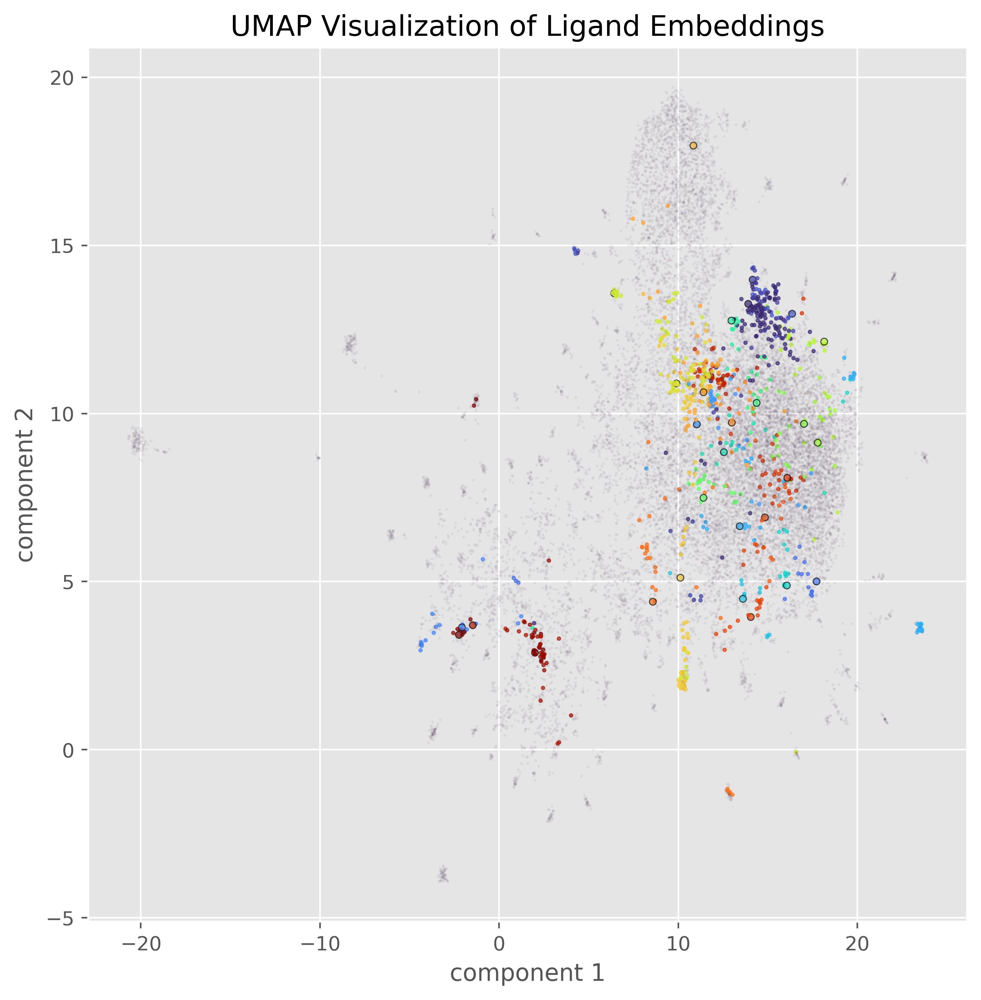

In [225]:
plot_clustering(umap_ligand, c, s, ec, 'UMAP Visualization of Ligand Embeddings')

In [226]:
reducer = umap.UMAP(min_dist=0.5, n_neighbors=100)
umap_combined = reducer.fit_transform(combined_embedding)

/tmp/ipykernel_2853946/250346826.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('turbo', n_clusters) # 'nipy_spectral' is a good choice for many distinct colors


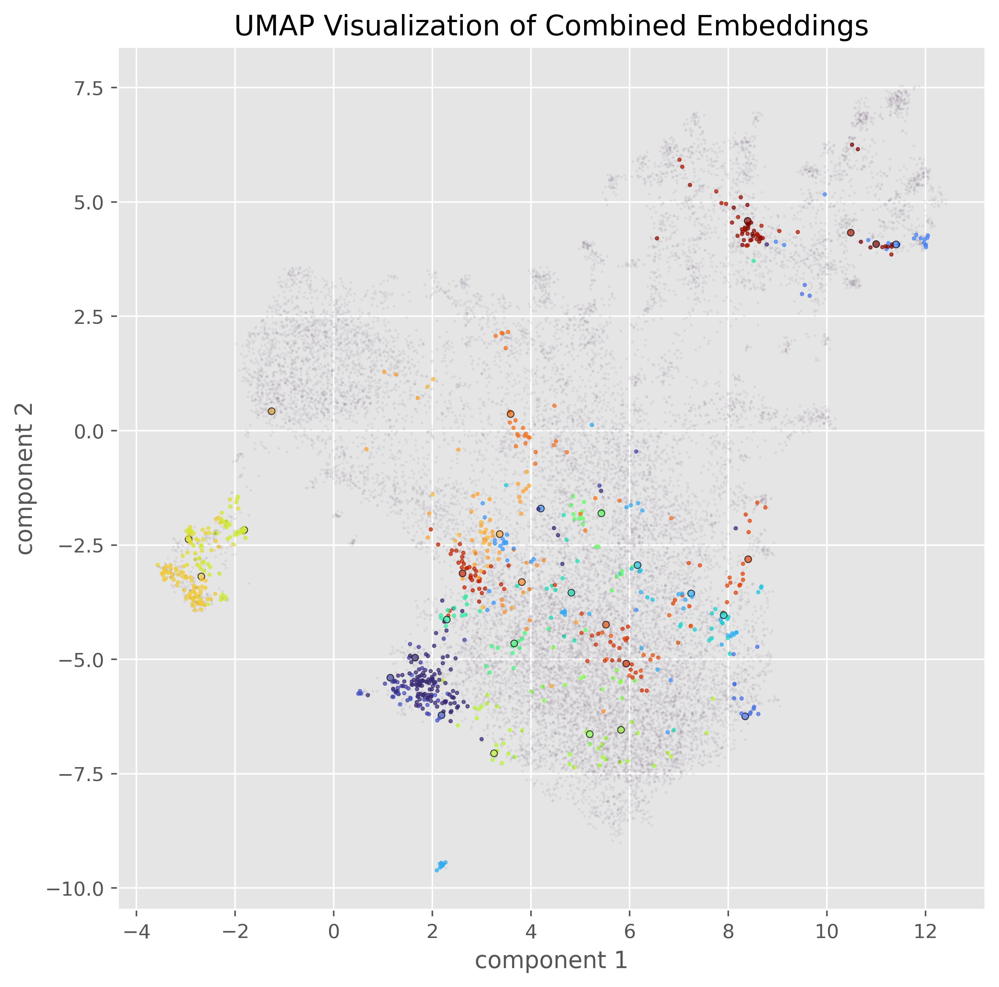

In [227]:
plot_clustering(umap_combined, c, s, ec, 'UMAP Visualization of Combined Embeddings')